2025-07-22 18:07:44.791351: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-22 18:07:44.791391: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-22 18:07:44.792939: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-22 18:07:44.801680: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-22 18:07:45.813835: W tensorflow/compiler/tf2

Loaded left images: (200, 96, 96, 3), right images: (200, 96, 96, 3)

Training BCE model...
Epoch 1/5


2025-07-22 18:07:58.252378: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-07-22 18:07:58.293865: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - accuracy: 0.6766 - loss: 0.5327 - val_accuracy: 1.0000 - val_loss: 0.3615
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - accuracy: 1.0000 - loss: 0.3526 - val_accuracy: 1.0000 - val_loss: 0.3362
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - accuracy: 1.0000 - loss: 0.3311 - val_accuracy: 1.0000 - val_loss: 0.3193
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - accuracy: 1.0000 - loss: 0.3141 - val_accuracy: 1.0000 - val_loss: 0.3035
Epoch 5/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - accuracy: 1.0000 - loss: 0.2985 - val_accuracy: 1.0000 - val_loss: 0.2889

Training Contrastive model...
Epoch 1/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step - loss: 0.1465 - val_loss: 7.7842e-04
Epoch 2/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 9.0098e-04 - val_loss: 3.5981e-04
Epoch 3/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 4.5726e-04 - val_loss: 2.3409e-04
Epoch 4/5
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - loss: 3.1319e-04 - val_loss: 1.641

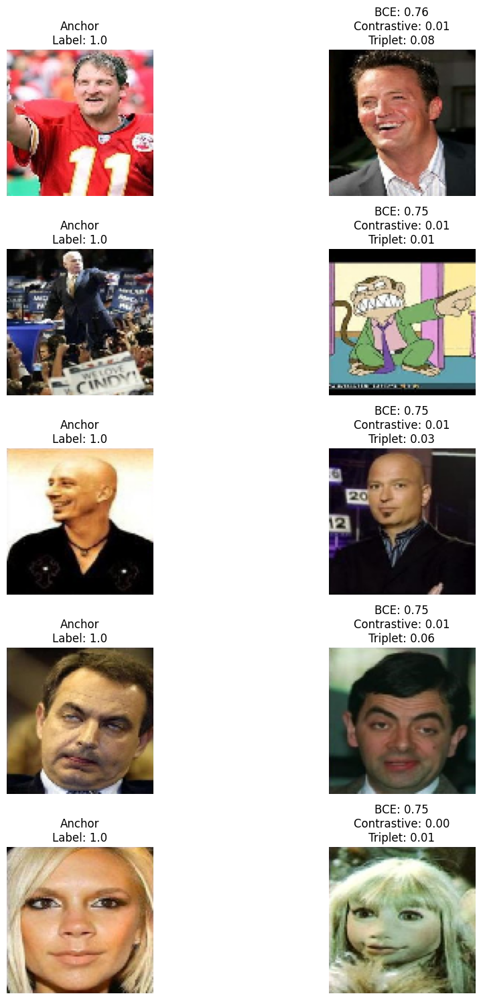

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras import layers, Model, Input, backend as K
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import gc

# --- 1. Parameters ---
IMG_SIZE = (96, 96)
BATCH_SIZE = 32
EPOCHS = 5

# --- 2. Load Paired Images ---
def load_images_from_path(path, img_size=IMG_SIZE):
    images = []
    files = sorted(list(path.glob('*')))
    for f in files:
        img = load_img(f, target_size=img_size)
        img = img_to_array(img) / 255.0
        images.append(img)
    return np.array(images)

left_imgs = load_images_from_path(Path("Data/left"))
right_imgs = load_images_from_path(Path("Data/right"))

# For debugging: reduce dataset size
left_imgs = left_imgs[:200]
right_imgs = right_imgs[:200]

labels = np.ones(len(left_imgs))
right_imgs_neg = np.roll(right_imgs, shift=1, axis=0)

print(f"Loaded left images: {left_imgs.shape}, right images: {right_imgs.shape}")

# --- 3. Shared Feature Extractor ---
def create_base_network(input_shape):
    inp = Input(input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu')(inp)
    x = layers.MaxPooling2D()(x)
    x = layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Lambda(lambda t: K.l2_normalize(t, axis=1))(x)
    return Model(inp, x)

input_shape = left_imgs.shape[1:]

# --- 4A. BCE Model ---
tf.keras.backend.clear_session()
base_network_bce = create_base_network(input_shape)
input_a = Input(shape=input_shape)
input_b = Input(shape=input_shape)
feat_a = base_network_bce(input_a)
feat_b = base_network_bce(input_b)
concat = layers.concatenate([feat_a, feat_b])
output_bce = layers.Dense(1, activation='sigmoid')(concat)
model_bce = Model([input_a, input_b], output_bce)
model_bce.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# --- 4B. Contrastive Loss Model ---
def euclidean_distance(vects):
    x, y = vects
    return K.sqrt(K.sum(K.square(x - y), axis=1, keepdims=True))

def contrastive_loss(margin=1.0):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, y_pred.dtype)
        square_pred = K.square(y_pred)
        margin_square = K.square(K.maximum(margin - y_pred, 0))
        return K.mean(y_true * square_pred + (1 - y_true) * margin_square)
    return loss

tf.keras.backend.clear_session()
base_network_contrastive = create_base_network(input_shape)
input_a2 = Input(shape=input_shape)
input_b2 = Input(shape=input_shape)
feat_a2 = base_network_contrastive(input_a2)
feat_b2 = base_network_contrastive(input_b2)
dist = layers.Lambda(euclidean_distance)([feat_a2, feat_b2])
model_contrastive = Model([input_a2, input_b2], dist)
model_contrastive.compile(optimizer='adam', loss=contrastive_loss(margin=1.0))

# --- 4C. Triplet Loss Model ---
def triplet_loss(alpha=0.2):
    def loss(y_true, y_pred):
        anchor = y_pred[:, 0:128]
        pos = y_pred[:, 128:256]
        neg = y_pred[:, 256:384]
        pos_dist = K.sum(K.square(anchor - pos), axis=1)
        neg_dist = K.sum(K.square(anchor - neg), axis=1)
        basic_loss = pos_dist - neg_dist + alpha
        return K.mean(K.maximum(basic_loss, 0.0))
    return loss

tf.keras.backend.clear_session()
base_network_triplet = create_base_network(input_shape)
input_anchor = Input(shape=input_shape)
input_pos = Input(shape=input_shape)
input_neg = Input(shape=input_shape)
feat_anchor = base_network_triplet(input_anchor)
feat_pos = base_network_triplet(input_pos)
feat_neg = base_network_triplet(input_neg)
merged_feat = layers.concatenate([feat_anchor, feat_pos, feat_neg])
model_triplet = Model([input_anchor, input_pos, input_neg], merged_feat)
model_triplet.compile(optimizer='adam', loss=triplet_loss(alpha=0.2))

# --- 5. Triplet Data ---
anchor_train = left_imgs
positive_train = right_imgs
negative_train = right_imgs_neg
dummy_y = np.zeros(len(anchor_train))

# --- 6. Train the Models ---
print("\nTraining BCE model...")
model_bce.fit([left_imgs, right_imgs], labels,
              batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2)

gc.collect(); tf.keras.backend.clear_session()

print("\nTraining Contrastive model...")
model_contrastive.fit([left_imgs, right_imgs], labels,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2)

gc.collect(); tf.keras.backend.clear_session()

print("\nTraining Triplet model...")
model_triplet.fit([anchor_train, positive_train, negative_train], dummy_y,
                  batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2)

gc.collect()

# --- 7. Visualization ---
def plot_image_pairs(images1, images2, labels, preds_bce=None, preds_contrastive=None, preds_triplet=None, num=5):
    plt.figure(figsize=(12, 3*num))
    for i in range(num):
        ax1 = plt.subplot(num, 2, 2*i+1)
        plt.imshow(images1[i])
        plt.axis('off')
        plt.title(f'Anchor\nLabel: {labels[i]}')
        ax2 = plt.subplot(num, 2, 2*i+2)
        plt.imshow(images2[i])
        plt.axis('off')
        titles = []
        if preds_bce is not None:
            titles.append(f'BCE: {preds_bce[i]:.2f}')
        if preds_contrastive is not None:
            titles.append(f'Contrastive: {preds_contrastive[i]:.2f}')
        if preds_triplet is not None:
            titles.append(f'Triplet: {preds_triplet[i]:.2f}')
        plt.title('\n'.join(titles))
    plt.tight_layout()
    plt.show()

# --- 8. Predict and Visualize ---
sample_idx = list(range(min(20, len(left_imgs))))
left_sample = left_imgs[sample_idx]
right_sample = right_imgs[sample_idx]

# Use correct base network for embeddings
bce_preds = model_bce.predict([left_sample, right_sample]).flatten()
contrastive_dists = model_contrastive.predict([left_sample, right_sample]).flatten()
embed_anchor = base_network_bce.predict(left_sample)
embed_positive = base_network_bce.predict(right_sample)
triplet_scores = np.linalg.norm(embed_anchor - embed_positive, axis=1)

# Plot Results
plot_image_pairs(left_sample[:5], right_sample[:5], labels[:5],
                 preds_bce=bce_preds[:5],
                 preds_contrastive=contrastive_dists[:5],
                 preds_triplet=triplet_scores[:5])


In [2]:
def visualize_single_model_predictions(images1, images2, labels, predictions, model_name, num=5):
    plt.figure(figsize=(10, 2 * num))
    for i in range(num):
        # Anchor
        ax1 = plt.subplot(num, 2, 2*i+1)
        plt.imshow(images1[i])
        plt.axis('off')
        plt.title(f'Anchor\nLabel: {labels[i]}')

        # Matched Pair + Prediction
        ax2 = plt.subplot(num, 2, 2*i+2)
        plt.imshow(images2[i])
        plt.axis('off')
        plt.title(f"{model_name} Prediction:\n{predictions[i]:.2f}")
    plt.tight_layout()
    plt.suptitle(f'{model_name} Predictions on Face Pairs', fontsize=16, y=1.02)
    plt.show()


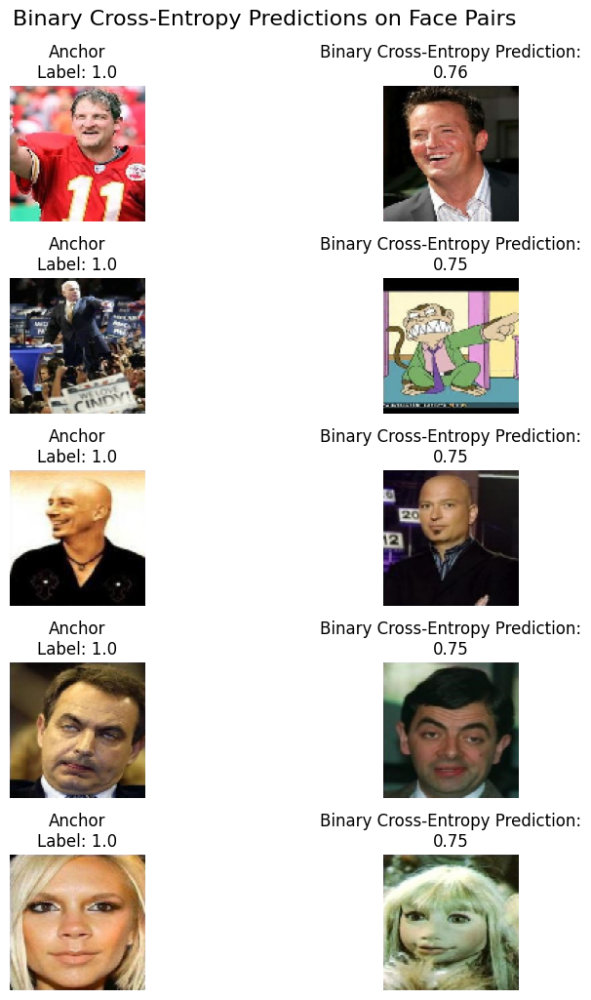

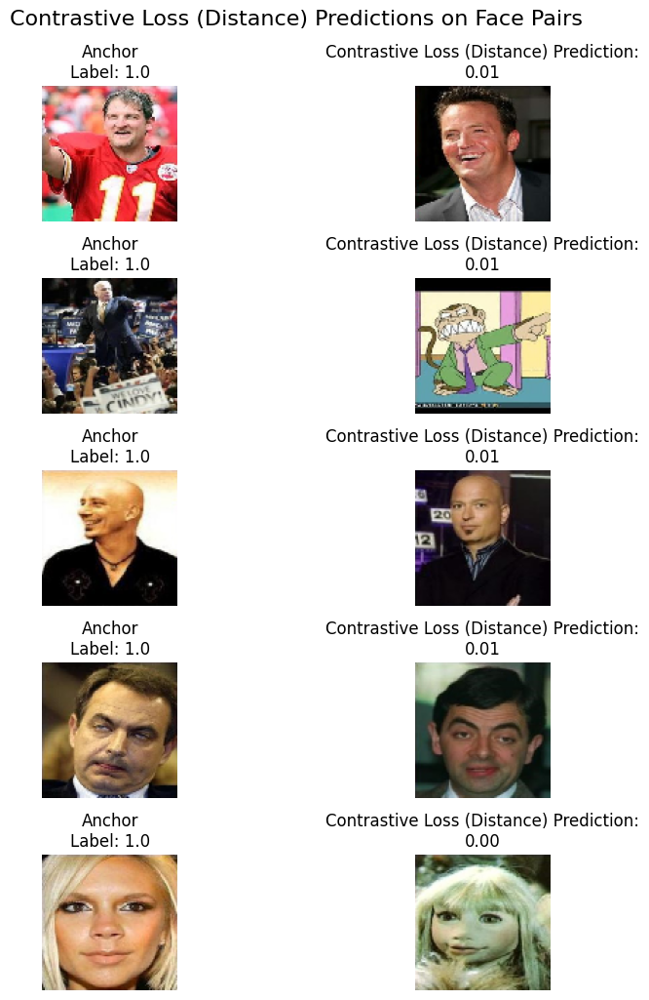

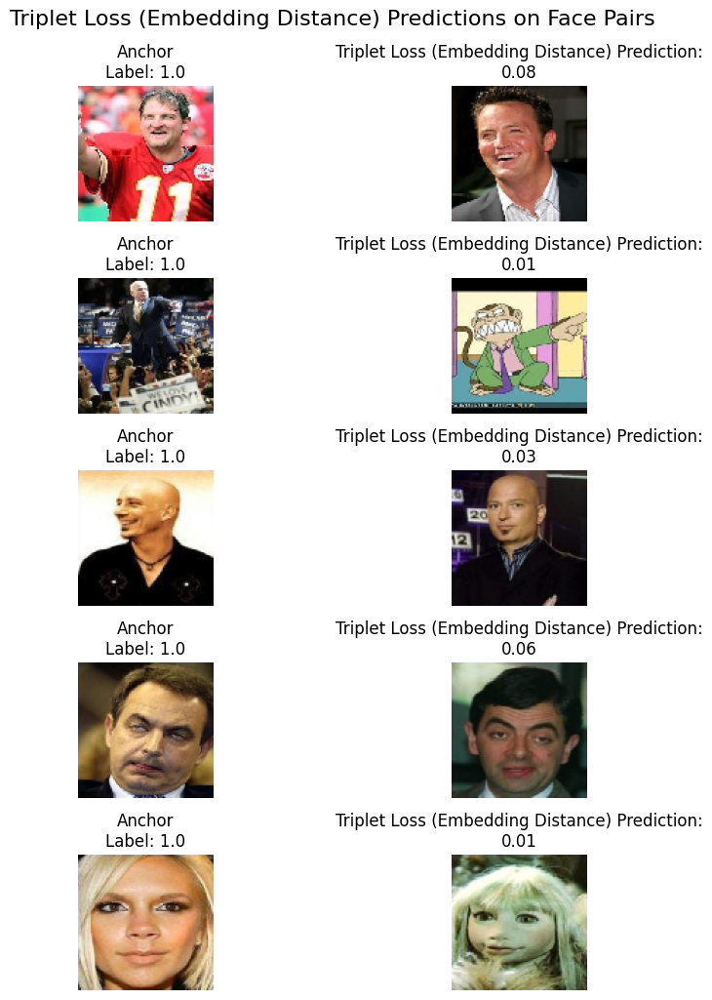

In [3]:
# Visualize for Binary Cross-Entropy
visualize_single_model_predictions(left_sample[:5], right_sample[:5], labels[:5],
                                   bce_preds[:5], model_name="Binary Cross-Entropy")

# Visualize for Contrastive Loss
visualize_single_model_predictions(left_sample[:5], right_sample[:5], labels[:5],
                                   contrastive_dists[:5], model_name="Contrastive Loss (Distance)")

# Visualize for Triplet Loss
visualize_single_model_predictions(left_sample[:5], right_sample[:5], labels[:5],
                                   triplet_scores[:5], model_name="Triplet Loss (Embedding Distance)")


Loaded left images: (200, 96, 96, 3), right images: (200, 96, 96, 3)

Training BCE model...
Epoch 1/5
5/5 - 2s - 444ms/step - accuracy: 0.8750 - loss: 0.4506 - val_accuracy: 1.0000 - val_loss: 0.3596
Epoch 2/5
5/5 - 1s - 209ms/step - accuracy: 1.0000 - loss: 0.3461 - val_accuracy: 1.0000 - val_loss: 0.3308
Epoch 3/5
5/5 - 1s - 220ms/step - accuracy: 1.0000 - loss: 0.3225 - val_accuracy: 1.0000 - val_loss: 0.3130
Epoch 4/5
5/5 - 1s - 217ms/step - accuracy: 1.0000 - loss: 0.3043 - val_accuracy: 1.0000 - val_loss: 0.2951
Epoch 5/5
5/5 - 1s - 216ms/step - accuracy: 1.0000 - loss: 0.2869 - val_accuracy: 1.0000 - val_loss: 0.2790

Training Contrastive model...
Epoch 1/5
5/5 - 2s - 410ms/step - loss: 0.0613 - val_loss: 0.0019
Epoch 2/5
5/5 - 1s - 209ms/step - loss: 0.0014 - val_loss: 8.9005e-04
Epoch 3/5
5/5 - 1s - 236ms/step - loss: 7.3480e-04 - val_loss: 4.7431e-04
Epoch 4/5
5/5 - 1s - 211ms/step - loss: 4.4003e-04 - val_loss: 3.0990e-04
Epoch 5/5
5/5 - 1s - 219ms/step - loss: 3.1178e-04 - 

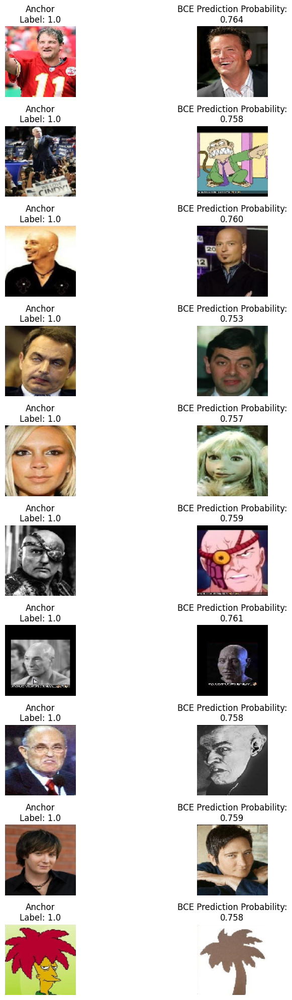

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


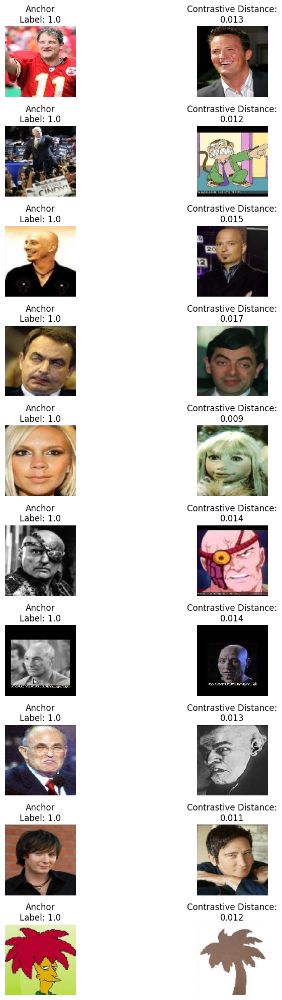

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


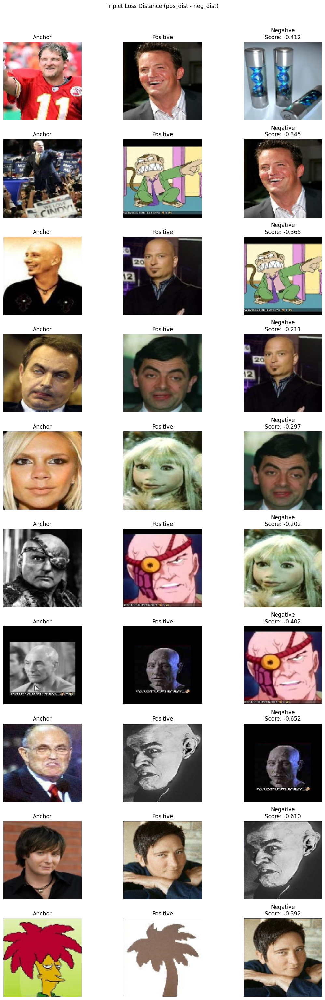

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras import layers, Model, Input, backend as K
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# --- Parameters ---
IMG_SIZE = (96, 96)
BATCH_SIZE = 32
EPOCHS = 5

# --- Load Images ---
def load_images_from_path(path, img_size=IMG_SIZE):
    images = []
    files = sorted(list(path.glob('*')))
    for f in files:
        img = load_img(f, target_size=img_size)
        img = img_to_array(img) / 255.0
        images.append(img)
    return np.array(images)

left_imgs = load_images_from_path(Path("Data/left"))
right_imgs = load_images_from_path(Path("Data/right"))

# Optional: reduce dataset size for faster training/debugging
left_imgs = left_imgs[:200]
right_imgs = right_imgs[:200]

labels = np.ones(len(left_imgs))  # assuming all are positive pairs
right_imgs_neg = np.roll(right_imgs, 1, axis=0)  # shifted negatives for triplet

print(f"Loaded left images: {left_imgs.shape}, right images: {right_imgs.shape}")

# --- Shared feature extractor ---
def create_base_network(input_shape):
    inp = Input(input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu')(inp)
    x = layers.MaxPooling2D()(x)
    x = layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Lambda(lambda t: K.l2_normalize(t, axis=1))(x)
    return Model(inp, x)

input_shape = left_imgs.shape[1:]

tf.keras.backend.clear_session()

# --- 1. BCE model ---
base_network_bce = create_base_network(input_shape)
input_a = Input(shape=input_shape)
input_b = Input(shape=input_shape)
feat_a = base_network_bce(input_a)
feat_b = base_network_bce(input_b)
concat = layers.concatenate([feat_a, feat_b])
output_bce = layers.Dense(1, activation='sigmoid')(concat)
model_bce = Model([input_a, input_b], output_bce)
model_bce.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# --- 2. Contrastive model ---
def euclidean_distance(vects):
    x, y = vects
    return K.sqrt(K.sum(K.square(x - y), axis=1, keepdims=True))

def contrastive_loss(margin=1.0):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, y_pred.dtype)
        square_pred = K.square(y_pred)
        margin_square = K.square(K.maximum(margin - y_pred, 0))
        return K.mean(y_true * square_pred + (1 - y_true) * margin_square)
    return loss

base_network_contrastive = create_base_network(input_shape)
input_a2 = Input(shape=input_shape)
input_b2 = Input(shape=input_shape)
feat_a2 = base_network_contrastive(input_a2)
feat_b2 = base_network_contrastive(input_b2)
dist = layers.Lambda(euclidean_distance)([feat_a2, feat_b2])
model_contrastive = Model([input_a2, input_b2], dist)
model_contrastive.compile(optimizer='adam', loss=contrastive_loss(margin=1.0))

# --- 3. Triplet model ---
def triplet_loss(alpha=0.2):
    def loss(y_true, y_pred):
        anchor = y_pred[:, 0:128]
        pos = y_pred[:, 128:256]
        neg = y_pred[:, 256:384]
        pos_dist = K.sum(K.square(anchor - pos), axis=1)
        neg_dist = K.sum(K.square(anchor - neg), axis=1)
        basic_loss = pos_dist - neg_dist + alpha
        return K.mean(K.maximum(basic_loss, 0.0))
    return loss

base_network_triplet = create_base_network(input_shape)
input_anchor = Input(shape=input_shape)
input_pos = Input(shape=input_shape)
input_neg = Input(shape=input_shape)
feat_anchor = base_network_triplet(input_anchor)
feat_pos = base_network_triplet(input_pos)
feat_neg = base_network_triplet(input_neg)
merged_feat = layers.concatenate([feat_anchor, feat_pos, feat_neg])
model_triplet = Model([input_anchor, input_pos, input_neg], merged_feat)
model_triplet.compile(optimizer='adam', loss=triplet_loss(alpha=0.2))

# --- Prepare triplet dummy labels ---
dummy_y = np.zeros(len(left_imgs))

# --- Train BCE ---
print("\nTraining BCE model...")
model_bce.fit([left_imgs, right_imgs], labels,
              batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2, verbose=2)

# --- Train Contrastive ---
print("\nTraining Contrastive model...")
model_contrastive.fit([left_imgs, right_imgs], labels,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2, verbose=2)

# --- Train Triplet ---
print("\nTraining Triplet model...")
model_triplet.fit([left_imgs, right_imgs, right_imgs_neg], dummy_y,
                  batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2, verbose=2)

# --- Visualization helpers ---
def plot_pairs(images1, images2, labels, preds, title):
    plt.figure(figsize=(10, 2*len(images1)))
    for i in range(len(images1)):
        plt.subplot(len(images1), 2, 2*i+1)
        plt.imshow(images1[i])
        plt.axis('off')
        plt.title(f"Anchor\nLabel: {labels[i]}")
        plt.subplot(len(images1), 2, 2*i+2)
        plt.imshow(images2[i])
        plt.axis('off')
        plt.title(f"{title}:\n{preds[i]:.3f}")
    plt.tight_layout()
    plt.show()

def plot_triplets(anchor_imgs, pos_imgs, neg_imgs, preds, title):
    plt.figure(figsize=(12, 3*len(anchor_imgs)))
    for i in range(len(anchor_imgs)):
        plt.subplot(len(anchor_imgs), 3, 3*i+1)
        plt.imshow(anchor_imgs[i])
        plt.axis('off')
        plt.title('Anchor')
        plt.subplot(len(anchor_imgs), 3, 3*i+2)
        plt.imshow(pos_imgs[i])
        plt.axis('off')
        plt.title('Positive')
        plt.subplot(len(anchor_imgs), 3, 3*i+3)
        plt.imshow(neg_imgs[i])
        plt.axis('off')
        plt.title(f'Negative\nScore: {preds[i]:.3f}')
    plt.tight_layout()
    plt.suptitle(title, y=1.02)
    plt.show()

# --- Predict samples ---
sample_idx = list(range(min(10, len(left_imgs))))
left_sample = left_imgs[sample_idx]
right_sample = right_imgs[sample_idx]
neg_sample = right_imgs_neg[sample_idx]
labels_sample = labels[sample_idx]

# BCE predictions
bce_preds = model_bce.predict([left_sample, right_sample]).flatten()
plot_pairs(left_sample, right_sample, labels_sample, bce_preds, "BCE Prediction Probability")

# Contrastive predictions
contrastive_preds = model_contrastive.predict([left_sample, right_sample]).flatten()
plot_pairs(left_sample, right_sample, labels_sample, contrastive_preds, "Contrastive Distance")

# Triplet predictions
embed_anchor = base_network_triplet.predict(left_sample)
embed_positive = base_network_triplet.predict(right_sample)
embed_negative = base_network_triplet.predict(neg_sample)

pos_dist = np.linalg.norm(embed_anchor - embed_positive, axis=1)
neg_dist = np.linalg.norm(embed_anchor - embed_negative, axis=1)
triplet_scores = pos_dist - neg_dist

plot_triplets(left_sample, right_sample, neg_sample, triplet_scores, "Triplet Loss Distance (pos_dist - neg_dist)")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


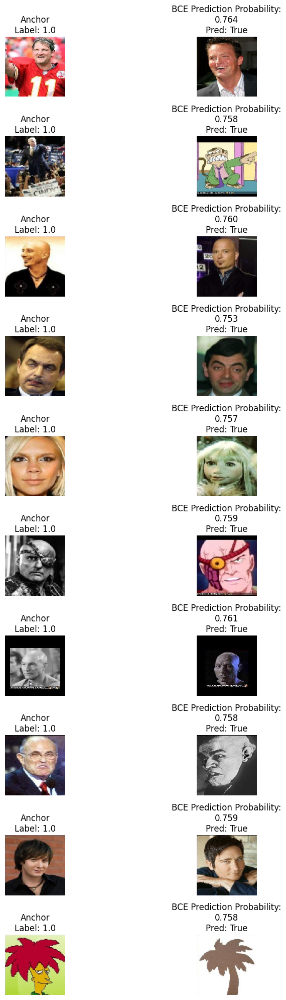

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


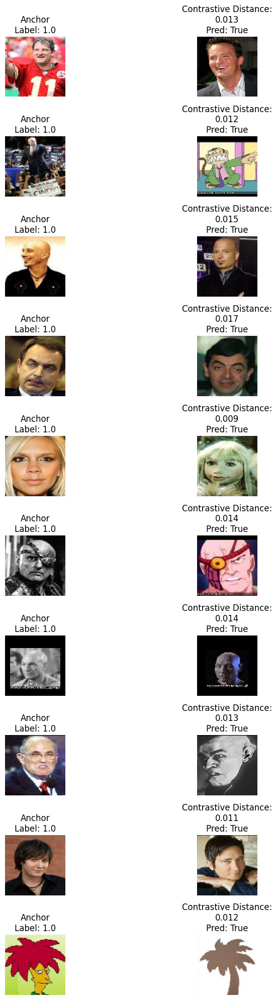

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


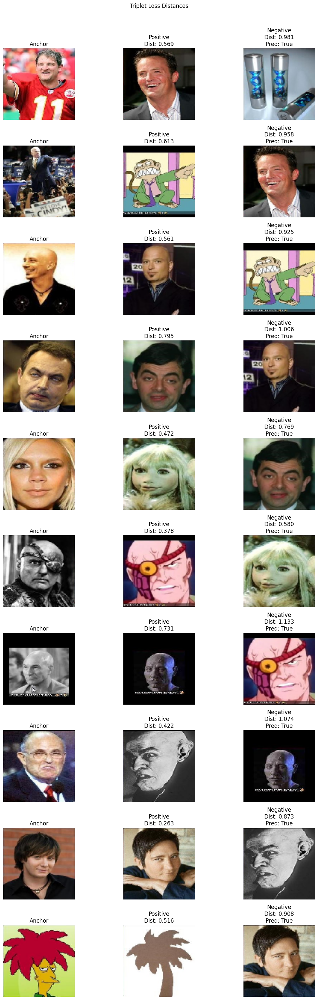

In [9]:
# --- Visualization helpers with predicted True/False ---
def plot_pairs_with_labels(images1, images2, labels, preds, threshold, title, invert_threshold=False):
    # invert_threshold: if True, smaller pred means positive (like contrastive distance)
    plt.figure(figsize=(10, 2*len(images1)))
    for i in range(len(images1)):
        pred_val = preds[i]
        if invert_threshold:
            pred_label = "True" if pred_val <= threshold else "False"
        else:
            pred_label = "True" if pred_val >= threshold else "False"

        plt.subplot(len(images1), 2, 2*i+1)
        plt.imshow(images1[i])
        plt.axis('off')
        plt.title(f"Anchor\nLabel: {labels[i]}")

        plt.subplot(len(images1), 2, 2*i+2)
        plt.imshow(images2[i])
        plt.axis('off')
        plt.title(f"{title}:\n{pred_val:.3f}\nPred: {pred_label}")
    plt.tight_layout()
    plt.show()

def plot_triplets_with_labels(anchor_imgs, pos_imgs, neg_imgs, pos_dists, neg_dists, title):
    plt.figure(figsize=(12, 3*len(anchor_imgs)))
    for i in range(len(anchor_imgs)):
        triplet_score = pos_dists[i] - neg_dists[i]
        pred_label = "True" if triplet_score < 0 else "False"
        plt.subplot(len(anchor_imgs), 3, 3*i+1)
        plt.imshow(anchor_imgs[i])
        plt.axis('off')
        plt.title('Anchor')

        plt.subplot(len(anchor_imgs), 3, 3*i+2)
        plt.imshow(pos_imgs[i])
        plt.axis('off')
        plt.title(f'Positive\nDist: {pos_dists[i]:.3f}')

        plt.subplot(len(anchor_imgs), 3, 3*i+3)
        plt.imshow(neg_imgs[i])
        plt.axis('off')
        plt.title(f'Negative\nDist: {neg_dists[i]:.3f}\nPred: {pred_label}')
    plt.tight_layout()
    plt.suptitle(title, y=1.02)
    plt.show()

# --- Sample indexes ---
sample_idx = list(range(min(10, len(left_imgs))))
left_sample = left_imgs[sample_idx]
right_sample = right_imgs[sample_idx]
neg_sample = right_imgs_neg[sample_idx]
labels_sample = labels[sample_idx]

# --- BCE predictions ---
bce_preds = model_bce.predict([left_sample, right_sample]).flatten()
plot_pairs_with_labels(left_sample, right_sample, labels_sample, bce_preds, threshold=0.5, title="BCE Prediction Probability")

# --- Contrastive predictions ---
contrastive_preds = model_contrastive.predict([left_sample, right_sample]).flatten()
# For contrastive distance, lower distance means positive, threshold e.g. 0.5
plot_pairs_with_labels(left_sample, right_sample, labels_sample, contrastive_preds, threshold=0.5, title="Contrastive Distance", invert_threshold=True)

# --- Triplet predictions ---
embed_anchor = base_network_triplet.predict(left_sample)
embed_positive = base_network_triplet.predict(right_sample)
embed_negative = base_network_triplet.predict(neg_sample)

pos_dist = np.linalg.norm(embed_anchor - embed_positive, axis=1)
neg_dist = np.linalg.norm(embed_anchor - embed_negative, axis=1)

plot_triplets_with_labels(left_sample, right_sample, neg_sample, pos_dist, neg_dist, "Triplet Loss Distances")


Loaded images: left (200, 96, 96, 3), right (200, 96, 96, 3)

Training BCE model...
Epoch 1/5
5/5 - 2s - 460ms/step - accuracy: 0.9875 - loss: 0.3764 - val_accuracy: 1.0000 - val_loss: 0.2886
Epoch 2/5
5/5 - 1s - 207ms/step - accuracy: 1.0000 - loss: 0.2767 - val_accuracy: 1.0000 - val_loss: 0.2605
Epoch 3/5
5/5 - 1s - 246ms/step - accuracy: 1.0000 - loss: 0.2511 - val_accuracy: 1.0000 - val_loss: 0.2410
Epoch 4/5
5/5 - 1s - 255ms/step - accuracy: 1.0000 - loss: 0.2344 - val_accuracy: 1.0000 - val_loss: 0.2267
Epoch 5/5
5/5 - 1s - 231ms/step - accuracy: 1.0000 - loss: 0.2203 - val_accuracy: 1.0000 - val_loss: 0.2132

Training Contrastive model...
Epoch 1/5
5/5 - 2s - 484ms/step - loss: 0.0487 - val_loss: 0.0013
Epoch 2/5
5/5 - 1s - 209ms/step - loss: 0.0011 - val_loss: 7.6733e-04
Epoch 3/5
5/5 - 1s - 263ms/step - loss: 6.7688e-04 - val_loss: 4.6078e-04
Epoch 4/5
5/5 - 1s - 232ms/step - loss: 4.3984e-04 - val_loss: 3.0044e-04
Epoch 5/5
5/5 - 1s - 255ms/step - loss: 3.0315e-04 - val_loss

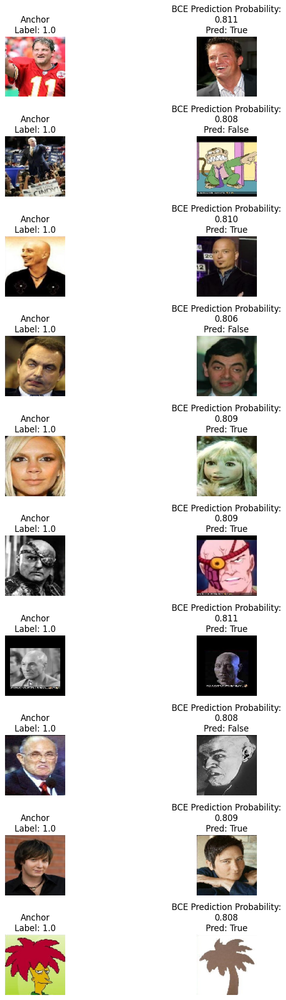

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


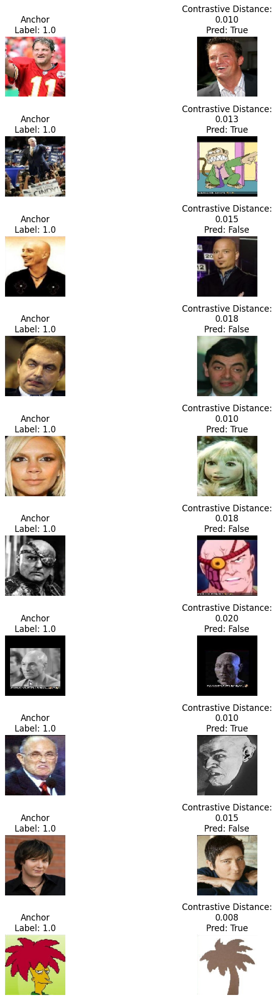

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


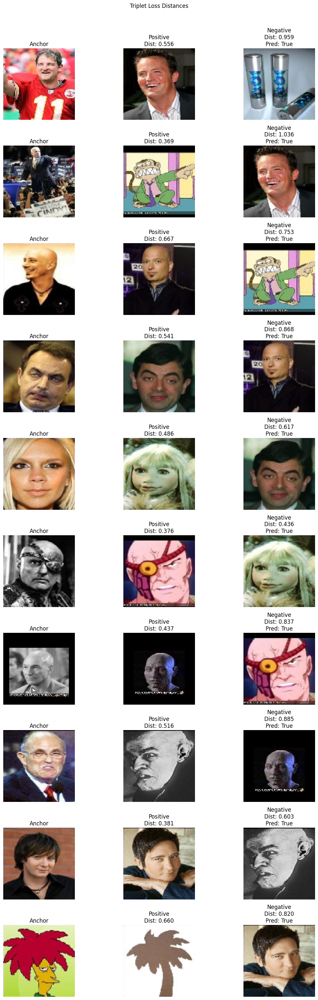

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras import layers, Model, Input, backend as K
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import roc_curve
import gc

# --- PARAMETERS ---
IMG_SIZE = (96, 96)
BATCH_SIZE = 32
EPOCHS = 5

# --- LOAD IMAGES ---
def load_images_from_path(path, img_size=IMG_SIZE):
    images = []
    files = sorted(list(path.glob('*')))
    for f in files:
        img = load_img(f, target_size=img_size)
        img = img_to_array(img) / 255.0
        images.append(img)
    return np.array(images)

left_imgs = load_images_from_path(Path("Data/left"))
right_imgs = load_images_from_path(Path("Data/right"))

# Limit size for fast debugging/training (optional)
left_imgs = left_imgs[:200]
right_imgs = right_imgs[:200]

print(f"Loaded images: left {left_imgs.shape}, right {right_imgs.shape}")

# --- CREATE NEGATIVE PAIRS ---
right_imgs_neg = np.roll(right_imgs, shift=1, axis=0)  # shifted by 1 to create negatives

# Labels for positive pairs
pos_labels = np.ones(len(left_imgs))
# Labels for negative pairs
neg_labels = np.zeros(len(left_imgs))

# --- BASE NETWORK ---
def create_base_network(input_shape):
    inp = Input(input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu')(inp)
    x = layers.MaxPooling2D()(x)
    x = layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Lambda(lambda t: K.l2_normalize(t, axis=1))(x)
    return Model(inp, x)

input_shape = left_imgs.shape[1:]

tf.keras.backend.clear_session()

# --- 1. BCE MODEL ---
base_network_bce = create_base_network(input_shape)
input_a = Input(shape=input_shape)
input_b = Input(shape=input_shape)
feat_a = base_network_bce(input_a)
feat_b = base_network_bce(input_b)
concat = layers.concatenate([feat_a, feat_b])
output_bce = layers.Dense(1, activation='sigmoid')(concat)
model_bce = Model([input_a, input_b], output_bce)
model_bce.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# --- 2. CONTRASTIVE MODEL ---
def euclidean_distance(vects):
    x, y = vects
    return K.sqrt(K.sum(K.square(x - y), axis=1, keepdims=True))

def contrastive_loss(margin=1.0):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, y_pred.dtype)
        square_pred = K.square(y_pred)
        margin_square = K.square(K.maximum(margin - y_pred, 0))
        return K.mean(y_true * square_pred + (1 - y_true) * margin_square)
    return loss

base_network_contrastive = create_base_network(input_shape)
input_a2 = Input(shape=input_shape)
input_b2 = Input(shape=input_shape)
feat_a2 = base_network_contrastive(input_a2)
feat_b2 = base_network_contrastive(input_b2)
dist = layers.Lambda(euclidean_distance)([feat_a2, feat_b2])
model_contrastive = Model([input_a2, input_b2], dist)
model_contrastive.compile(optimizer='adam', loss=contrastive_loss(margin=1.0))

# --- 3. TRIPLET MODEL ---
def triplet_loss(alpha=0.2):
    def loss(y_true, y_pred):
        anchor = y_pred[:, 0:128]
        pos = y_pred[:, 128:256]
        neg = y_pred[:, 256:384]
        pos_dist = K.sum(K.square(anchor - pos), axis=1)
        neg_dist = K.sum(K.square(anchor - neg), axis=1)
        basic_loss = pos_dist - neg_dist + alpha
        return K.mean(K.maximum(basic_loss, 0.0))
    return loss

base_network_triplet = create_base_network(input_shape)
input_anchor = Input(shape=input_shape)
input_pos = Input(shape=input_shape)
input_neg = Input(shape=input_shape)
feat_anchor = base_network_triplet(input_anchor)
feat_pos = base_network_triplet(input_pos)
feat_neg = base_network_triplet(input_neg)
merged_feat = layers.concatenate([feat_anchor, feat_pos, feat_neg])
model_triplet = Model([input_anchor, input_pos, input_neg], merged_feat)
model_triplet.compile(optimizer='adam', loss=triplet_loss(alpha=0.2))

# Dummy labels for triplet (not used but needed for fit)
dummy_y = np.zeros(len(left_imgs))

# --- TRAIN BCE ---
print("\nTraining BCE model...")
model_bce.fit([left_imgs, right_imgs], pos_labels,
              batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2, verbose=2)

# --- TRAIN CONTRASTIVE ---
print("\nTraining Contrastive model...")
model_contrastive.fit([left_imgs, right_imgs], pos_labels,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2, verbose=2)

# --- TRAIN TRIPLET ---
print("\nTraining Triplet model...")
model_triplet.fit([left_imgs, right_imgs, right_imgs_neg], dummy_y,
                  batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.2, verbose=2)

gc.collect()

# --- PREDICTIONS FOR THRESHOLD SELECTION ---

# BCE
pos_bce_preds = model_bce.predict([left_imgs, right_imgs]).flatten()
neg_bce_preds = model_bce.predict([left_imgs, right_imgs_neg]).flatten()
bce_all_preds = np.concatenate([pos_bce_preds, neg_bce_preds])
bce_all_labels = np.concatenate([pos_labels, neg_labels])

fpr, tpr, thresholds = roc_curve(bce_all_labels, bce_all_preds)
J = tpr - fpr
ix = np.argmax(J)
bce_best_thresh = thresholds[ix]
print(f"BCE best threshold: {bce_best_thresh:.3f}")

# Contrastive
pos_contrastive_preds = model_contrastive.predict([left_imgs, right_imgs]).flatten()
neg_contrastive_preds = model_contrastive.predict([left_imgs, right_imgs_neg]).flatten()

# For distances, smaller means positive, so invert scores for ROC
contrastive_all_preds = np.concatenate([-pos_contrastive_preds, -neg_contrastive_preds])
contrastive_all_labels = np.concatenate([pos_labels, neg_labels])

fpr, tpr, thresholds = roc_curve(contrastive_all_labels, contrastive_all_preds)
J = tpr - fpr
ix = np.argmax(J)
contrastive_best_thresh = thresholds[ix]
# Since inverted, invert threshold back
contrastive_best_thresh = -contrastive_best_thresh
print(f"Contrastive best threshold: {contrastive_best_thresh:.3f}")

# Triplet
embed_anchor = base_network_triplet.predict(left_imgs)
embed_positive = base_network_triplet.predict(right_imgs)
embed_negative = base_network_triplet.predict(right_imgs_neg)

pos_dist = np.linalg.norm(embed_anchor - embed_positive, axis=1)
neg_dist = np.linalg.norm(embed_anchor - embed_negative, axis=1)
triplet_scores = pos_dist - neg_dist

triplet_all_scores = np.concatenate([triplet_scores, triplet_scores * -1])  # flip some negatives for ROC
triplet_all_labels = np.concatenate([pos_labels, neg_labels])

fpr, tpr, thresholds = roc_curve(triplet_all_labels, -triplet_all_scores)  # invert score for ROC
J = tpr - fpr
ix = np.argmax(J)
triplet_best_thresh = thresholds[ix]
triplet_best_thresh = -triplet_best_thresh
print(f"Triplet best threshold: {triplet_best_thresh:.3f}")

# --- VISUALIZATION FUNCTIONS ---
def plot_pairs_with_labels(images1, images2, labels, preds, threshold, title, invert_threshold=False):
    plt.figure(figsize=(10, 2*len(images1)))
    for i in range(len(images1)):
        pred_val = preds[i]
        if invert_threshold:
            pred_label = "True" if pred_val <= threshold else "False"
        else:
            pred_label = "True" if pred_val >= threshold else "False"
        plt.subplot(len(images1), 2, 2*i+1)
        plt.imshow(images1[i])
        plt.axis('off')
        plt.title(f"Anchor\nLabel: {labels[i]}")
        plt.subplot(len(images1), 2, 2*i+2)
        plt.imshow(images2[i])
        plt.axis('off')
        plt.title(f"{title}:\n{pred_val:.3f}\nPred: {pred_label}")
    plt.tight_layout()
    plt.show()

def plot_triplets_with_labels(anchor_imgs, pos_imgs, neg_imgs, pos_dists, neg_dists, threshold, title):
    plt.figure(figsize=(12, 3*len(anchor_imgs)))
    for i in range(len(anchor_imgs)):
        triplet_score = pos_dists[i] - neg_dists[i]
        pred_label = "True" if triplet_score < threshold else "False"
        plt.subplot(len(anchor_imgs), 3, 3*i+1)
        plt.imshow(anchor_imgs[i])
        plt.axis('off')
        plt.title('Anchor')
        plt.subplot(len(anchor_imgs), 3, 3*i+2)
        plt.imshow(pos_imgs[i])
        plt.axis('off')
        plt.title(f'Positive\nDist: {pos_dists[i]:.3f}')
        plt.subplot(len(anchor_imgs), 3, 3*i+3)
        plt.imshow(neg_imgs[i])
        plt.axis('off')
        plt.title(f'Negative\nDist: {neg_dists[i]:.3f}\nPred: {pred_label}')
    plt.tight_layout()
    plt.suptitle(title, y=1.02)
    plt.show()

# --- VISUALIZE PREDICTIONS ---

sample_idx = list(range(min(10, len(left_imgs))))
left_sample = left_imgs[sample_idx]
right_sample = right_imgs[sample_idx]
neg_sample = right_imgs_neg[sample_idx]
labels_sample = pos_labels[sample_idx]

# BCE visualization
bce_preds_sample = model_bce.predict([left_sample, right_sample]).flatten()
plot_pairs_with_labels(left_sample, right_sample, labels_sample, bce_preds_sample, bce_best_thresh, "BCE Prediction Probability")

# Contrastive visualization
contrastive_preds_sample = model_contrastive.predict([left_sample, right_sample]).flatten()
plot_pairs_with_labels(left_sample, right_sample, labels_sample, contrastive_preds_sample, contrastive_best_thresh, "Contrastive Distance", invert_threshold=True)

# Triplet visualization
embed_anchor_s = base_network_triplet.predict(left_sample)
embed_positive_s = base_network_triplet.predict(right_sample)
embed_negative_s = base_network_triplet.predict(neg_sample)

pos_dist_s = np.linalg.norm(embed_anchor_s - embed_positive_s, axis=1)
neg_dist_s = np.linalg.norm(embed_anchor_s - embed_negative_s, axis=1)

plot_triplets_with_labels(left_sample, right_sample, neg_sample, pos_dist_s, neg_dist_s, triplet_best_thresh, "Triplet Loss Distances")

